In [1]:
# NOTE FOR LOCAL EXECUTION: use pytorch kernel and execute the code below to specify cuda device
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

# BERT and Explainable AI

## Load required libraries

In [2]:
!pip install pandas
!pip install transformers
!pip install transformers-interpret

## Import libraries

In [1]:
from utils import *
import pandas as pd
import pickle
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from transformers_interpret import SequenceClassificationExplainer

c:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\big_five\NEU\utils.py:10: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  auc_metric = load_metric("roc_auc", trust_remote_code=True)


## Load data

In [2]:
# Original data
#df = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\essays.csv", encoding = "latin-1")

# Alternatively, load fragmented validation and test partitions
df_train = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_essays_fragm_train.csv")
df_valid = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_essays_fragm_valid.csv")
df_test = pd.read_csv(r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\datasets\df_essays_fragm_test.csv")
#df = pd.concat([df_valid, df_test], axis=0, ignore_index=True)
df = df_test

# Another alternative, load training partition
#df = df_train

df.head()

,#AUTHID,TEXT,cEXT,cNEU,cAGR,cCON,cOPN
0,2000_999176.txt,spark up a conversation with a member of the o...,0,1,0,0,1
1,1999_915632.txt,well I just got back from my home town in hunt...,0,0,0,1,0
2,2000_515950.txt,"that I would not be like the rest, but an indi...",0,1,0,0,1
3,2000_935195.txt,So here are twenty minutes of Brian's thoughts...,0,0,0,1,1
4,2000_933158.txt,know it they'll be a big nobody in the world. ...,1,1,1,1,1


In [5]:
print(len(df))

703


## Define Trait

In [3]:
trait = "cNEU"

## Load the fine-tuned model

In [4]:
# Path to the fine-tuned model
#model_path = r"C:\Users\david\OneDrive - Universitat de Barcelona (1)\Documentos\GitHub\Explainability\Agreeableness\results_agreeableness"  # my laptop
model_path = r"C:\Users\david\OneDrive - Universitat de Barcelona\GitHub\New explainability implementation\fine_tuning_models\results_neuroticism_fragm"

# Load the fine-tuned model and tokenizer
model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name, do_lower_case=True)
fine_tuned_model = AutoModelForSequenceClassification.from_pretrained(model_path)
cls_explainer = SequenceClassificationExplainer(fine_tuned_model, tokenizer)
print(cls_explainer.device)

cpu


  0%|          | 0/88 [00:00<?, ?it/s]

Trainer is attempting to log a value of "[[201 151]
 [116 235]]" of type <class 'numpy.ndarray'> for key "eval/conf_matrix" as a scalar. This invocation of Tensorboard's writer.add_scalar() is incorrect so we dropped this attribute.


{'eval_loss': 0.6862678527832031, 'eval_accuracy': 0.620199146514936, 'eval_roc_auc': 0.6202691983941985, 'eval_conf_matrix': array([[201, 151],
       [116, 235]], dtype=int64), 'eval_runtime': 361.7636, 'eval_samples_per_second': 1.943, 'eval_steps_per_second': 0.243}


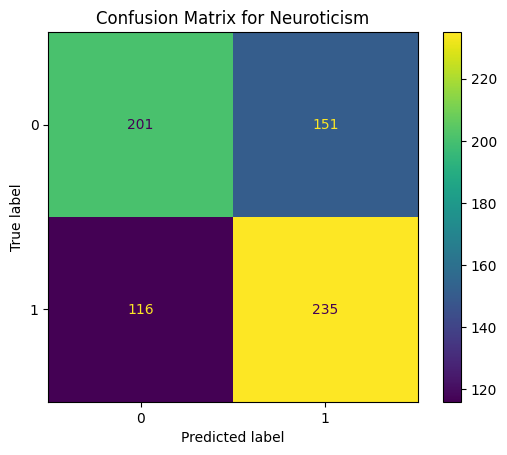

In [5]:
# Check that the model is correct

# Create datasets
X_train, X_valid, y_train, y_valid = create_partition_from_split(df_train, df_valid, 'TEXT', trait)
_, X_test, _, y_test = create_partition_from_split(df_train, df_test, 'TEXT', trait)
train_dataset, valid_dataset = create_datasets(tokenizer, X_train, X_valid, y_train, y_valid)
_, test_dataset = create_datasets(tokenizer, X_train, X_test, y_train, y_test)

# Create trainer
trainer = Trainer(
        model=fine_tuned_model,          # the instantiated Transformers model to be trained
        args=None,                       # training arguments
        train_dataset=train_dataset,     # training dataset
        eval_dataset=test_dataset,      # evaluation dataset
        compute_metrics=compute_metrics, # the callback that computes metrics of interest
        #optimizers=(optimizer, None)
    )

results = trainer.evaluate()
conf_matrix = results['eval_conf_matrix']
print(results)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()

# Add a title to the confusion matrix plot
plt.title("Confusion Matrix for Neuroticism")
plt.show()

In [10]:
import pickle

# Set the desired maximum sequence length
max_sequence_length = 512
attribution_threshold = 0.5  # Adjust the threshold as needed

# List to store word attributions for each row
all_word_attributions = []

# List to store sum of attributions for each row
all_sum_attributions = []

# Loop through all rows in the dataset
print("Number of rows:", len(df))
for row_index in range(len(df)):
    # Show progress every 100 sentences
    if row_index%100 == 0:
        print(row_index)

    preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
    word_attributions = cls_explainer(preproc_text)
    true_class = df.loc[row_index, trait]
    predicted_class = cls_explainer.predicted_class_name

    # Print the terms with scores greater than the threshold
    for token, score in word_attributions:
        if abs(score) > attribution_threshold:
            print(f'Token: {token}, Score: {score}')

    # Save the filtered attributions for this row along with true_class and predicted_class
    attribution_info = (word_attributions, true_class, predicted_class)
    all_word_attributions.append(attribution_info)

    # Visualize if there are filtered attributions
    if any(abs(score) > attribution_threshold for _, score in word_attributions):
        cls_explainer.visualize(true_class=true_class)
    
    # Sum of attributions for the entire text
    sum_attribution = cls_explainer.attributions.attributions_sum.sum()

    # Save the sum of attributions for this row
    all_sum_attributions.append((sum_attribution.item(), true_class, predicted_class))
        
# Save all_word_attributions to a file
word_attr_fname = get_all_word_attr_fname_essays(trait)
with open(word_attr_fname, 'wb') as file:
    pickle.dump(all_word_attributions, file)

# Save all_sum_attributions to a file
sum_attr_fname = get_all_sum_attr_fname_essays(trait)
with open(sum_attr_fname, 'wb') as file:
    pickle.dump(all_sum_attributions, file)

Number of rows: 703
0
Token: hate, Score: -0.5321422747728232


Token: ruin, Score: 0.5038337078083832


Token: ##s, Score: 0.5432567442981532


Token: its, Score: 0.579547959389157


Token: stupid, Score: -0.6244300862657831


Token: spoiled, Score: 0.5583358788468825
Token: minute, Score: -0.5793190457540973


Token: afraid, Score: 0.71010838392014


Token: messed, Score: -0.5334565619909211


Token: hate, Score: -0.6087496257846315


Token: ##e, Score: -0.5203090586364101


Token: lazy, Score: -0.5229508344818616


Token: ##s, Score: 0.5331357327014576


Token: disgusting, Score: 0.5626376482948688


Token: crazy, Score: -0.6444956813709783


Token: pathetic, Score: -0.6655338375292893


Token: horrible, Score: -0.5388260095251651


Token: scared, Score: -0.5234426983121983


Token: competing, Score: -0.5529177019330389


Token: expensive, Score: -0.5687028888546133


Token: mysterious, Score: 0.508789162743745


100
Token: sad, Score: 0.5539039094860645


Token: refuse, Score: 0.5376805348520338


Token: its, Score: 0.5106809336774009


Token: negative, Score: -0.5479931886279957


Token: comfort, Score: 0.6168090830435429


Token: !, Score: 0.5394589883954797


Token: would, Score: 0.5032947953092024


Token: its, Score: -0.6228758631666788


Token: hate, Score: 0.5157433333511945


Token: stressed, Score: 0.7450629341347774


Token: ##s, Score: 0.655670974081549


Token: hurts, Score: 0.5988903938764326


Token: broken, Score: 0.5287106851461624


Token: dread, Score: 0.5299222587036702


Token: song, Score: -0.5634205412495342


Token: destroying, Score: -0.6370528603420695


Token: lonely, Score: -0.5202860930418725


Token: ut, Score: 0.5705678554876267


200
Token: afraid, Score: 0.7172108596948277


Token: pressure, Score: -0.5183645571279863


Token: forced, Score: -0.6919756807298744


Token: scary, Score: 0.7721686537825783


Token: ##lifting, Score: 0.5019174647129729


Token: am, Score: 0.5666905890223424


Token: ', Score: 0.5191908068666194


Token: scared, Score: 0.6631447866389615


Token: lonely, Score: 0.5894555151909738


Token: hate, Score: -0.5130525777671678


Token: rebel, Score: 0.7581241492546947


Token: scared, Score: 0.5294097630219676


Token: hate, Score: -0.5447284666576283


Token: sick, Score: -0.5591955966048228


Token: hate, Score: -0.6236629936348007


300
Token: sad, Score: -0.5756416173874378


Token: v, Score: 0.5026656874424617


Token: gore, Score: -0.5845715699512298


Token: reminded, Score: -0.6113068386603199


Token: fear, Score: -0.5127014924762905


Token: hate, Score: -0.5325382777358864


Token: afraid, Score: 0.6761491957379113


Token: miserable, Score: -0.5010509324538287


Token: stressed, Score: 0.5343410400960815


Token: confusing, Score: -0.5944250561891473


Token: terrified, Score: 0.7095716470790406


Token: hurts, Score: 0.5892218737493838


Token: its, Score: 0.5689808786142017


Token: troubled, Score: -0.7446381161207449


Token: worried, Score: 0.5357988197994272


400
Token: worse, Score: -0.5228451738455162


Token: cry, Score: 0.5197268332009427


Token: fear, Score: 0.5759355353897045


Token: messed, Score: 0.6049573547831478


Token: paranoid, Score: 0.8475033797318642


Token: confused, Score: 0.5522596553625558


Token: stressed, Score: 0.6835535977112496
Token: torn, Score: 0.6259779271304746


Token: funny, Score: -0.5783152879323771


Token: mom, Score: -0.5168709170748025


500
Token: addiction, Score: -0.5466379546496023


Token: froze, Score: 0.5008512751449148


Token: anxiety, Score: 0.5605982208198899


Token: stress, Score: 0.6001688196733171


Token: amazing, Score: 0.5079985281000827


Token: though, Score: 0.5334375722752608


Token: stupid, Score: 0.6475900768464092


Token: awesome, Score: 0.5389892141874238


Token: creepy, Score: 0.5678576337767822


Token: confident, Score: -0.5683134934421653


Token: debt, Score: -0.624478525714512


Token: helps, Score: -0.5491989619152865


Token: struggle, Score: -0.5565003700738903


Token: its, Score: -0.7547938884032712


Token: stressed, Score: 0.6941974187672778


Token: grammar, Score: -0.5484650775391421


600
Token: hurt, Score: 0.5469346291910622


Token: forced, Score: -0.7433334690751272


Token: excited, Score: -0.5303038555685604


Token: dismay, Score: -0.6367396366310188


Token: stink, Score: 0.5065994359783458


Token: pressured, Score: 0.8358785306577917


Token: hurt, Score: 0.6013832545560066


Token: disappointed, Score: -0.6265244817174929


Token: insane, Score: 0.5446955492813743
Token: chaotic, Score: 0.6010917526114576


Token: stressed, Score: 0.5056228393103576


Token: fear, Score: 0.6960653116460221


700
Token: cruel, Score: -0.5930779285859554


In [5]:
import pickle

word_attr_fname = get_all_word_attr_fname_essays(trait)
sum_attr_fname = get_all_sum_attr_fname_essays(trait)

# Load the previously saved attributions from the file
with open(word_attr_fname, 'rb') as file:
    all_word_attributions = pickle.load(file)

# Load the previously saved attributions from the file
with open(sum_attr_fname, 'rb') as file:
    all_sum_attributions = pickle.load(file)

## Obtain Word Frequencies 

In [6]:
word_freq = get_word_freqs(all_word_attributions)
word_freq_label_1 = get_word_freqs(all_word_attributions, "LABEL_1")
word_freq_label_0 = get_word_freqs(all_word_attributions, "LABEL_0")

## Obtain Positive and Negative Attributions

In [7]:
# Get positive and negative attributions for the two labels
force_correct_classif=True
positive_attributions_label_1 = filter_attributions(all_word_attributions, '+', "LABEL_1", force_correct_classif)
positive_attributions_label_0 = filter_attributions(all_word_attributions, '+', "LABEL_0", force_correct_classif)
negative_attributions_label_1 = filter_attributions(all_word_attributions, '-', "LABEL_1", force_correct_classif)
negative_attributions_label_0 = filter_attributions(all_word_attributions, '-', "LABEL_0", force_correct_classif)

## Word Filtering Functions

In [8]:
# !pip install nltk

import nltk
from nltk.corpus import stopwords

# Obtain stop words
nltk.download('stopwords')
english_stopwords = stopwords.words('english')
#print(english_stopwords)

# Obtain list of words
nltk.download('words')
english_words = set(nltk.corpus.words.words())
#print(len(english_words))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\david\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\david\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## Word Clouds
### By attribution score

In [9]:
from wordcloud import WordCloud
from collections import Counter
import matplotlib.pyplot as plt

min_word_freq = 10
min_word_len = 4
sum_techniques = ["freq", "avg", "max", "accum", "gmean"]
#sum_techniques = ["avg"]

for sum_technique in sum_techniques:

    # Create separate lists for positive and negative attributions for LABEL_1
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq, min_word_len)
    positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq, min_word_len)
    negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

    # Create separate lists for positive and negative attributions for LABEL_0
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq, min_word_len)
    positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
    filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq, min_word_len)
    negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

    # Generate word clouds
    wordcloud_label_1_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_1)
    wordcloud_label_1_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_1)
    wordcloud_label_0_positive = WordCloud(background_color='white').generate_from_frequencies(positive_words_label_0)
    wordcloud_label_0_negative = WordCloud(background_color='white').generate_from_frequencies(negative_words_label_0)

    # Plot word clouds
    fig = plt.figure(figsize=(16, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(wordcloud_label_1_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(wordcloud_label_1_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_1) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(wordcloud_label_0_positive, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Positive Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(wordcloud_label_0_negative, interpolation='bilinear')
    plt.title(trait + ": Word Cloud for Negative Attributions (LABEL_0) " + sum_technique)
    plt.axis('off')

    plt.tight_layout()

    # Save the figure as a high-resolution image
    filename = f"Wordclouds_NEU_{sum_technique}.png"
    plt.savefig(filename, dpi = 300, bbox_inches = "tight")
    plt.close(fig)

## Barplots

In [10]:
min_word_freq = 10
sum_technique = "gmean"
# Create separate lists for positive and negative attributions for LABEL_1
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, positive_attributions_label_1, min_word_freq)
positive_words_label_1 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_1, negative_attributions_label_1, min_word_freq)
negative_words_label_1 = summarize_scores(filter_words(english_words, english_stopwords, word_freq, negative_attributions_label_1), sum_technique)

# Create separate lists for positive and negative attributions for LABEL_0
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, positive_attributions_label_0, min_word_freq)
positive_words_label_0 = summarize_scores(filtered_words, sum_technique)
filtered_words = filter_words(english_words, english_stopwords, word_freq_label_0, negative_attributions_label_0, min_word_freq)
negative_words_label_0 = summarize_scores(filtered_words, sum_technique)

# Plot horizontal bar plots for each category with both top and bottom significant words
plot_bar(positive_words_label_1, 'Positive Attributions (LABEL_1)', filename = "positive_label_1_barplot.png")
plot_bar(negative_words_label_1, 'Negative Attributions (LABEL_1)', filename = "negative_label_1_barplot.png")
plot_bar(positive_words_label_0, 'Positive Attributions (LABEL_0)', filename = "positive_label_0_barplot.png")
plot_bar(negative_words_label_0, 'Negative Attributions (LABEL_0)', filename = "negative_label_0_barplot.png")


Saved positive_label_1_barplot.png
Saved negative_label_1_barplot.png
Saved positive_label_0_barplot.png
Saved negative_label_0_barplot.png


## Histogram

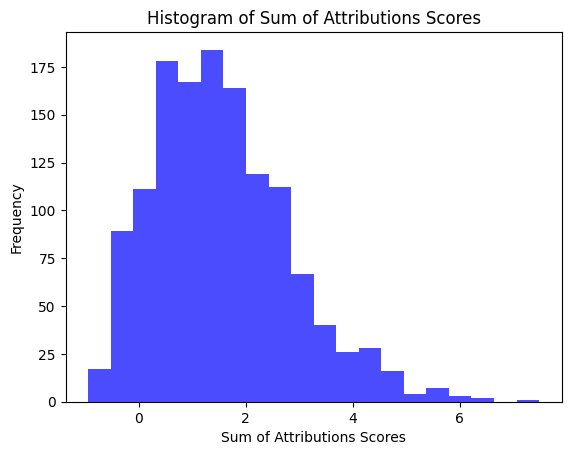

In [19]:
import matplotlib.pyplot as plt

# Create a histogram
filtered_sum_attributions = filter_sum_attributions(all_sum_attributions)
plt.hist(filtered_sum_attributions, bins=20, color='blue', alpha=0.7)
plt.title('Histogram of Sum of Attributions Scores')
plt.xlabel('Sum of Attributions Scores')
plt.ylabel('Frequency')
plt.show()

Percentile value: 0.6329120896110452
Percentile value: 1.3933002285626743
Percentile value: 2.313565898470367


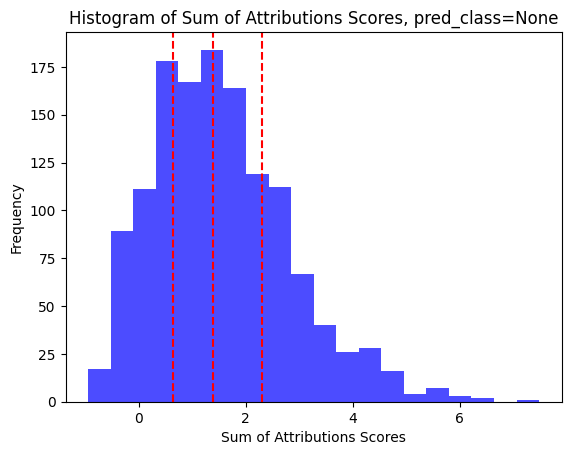

Percentile value: 0.47813456487519373
Percentile value: 1.3149649941390102
Percentile value: 2.4303142685492003


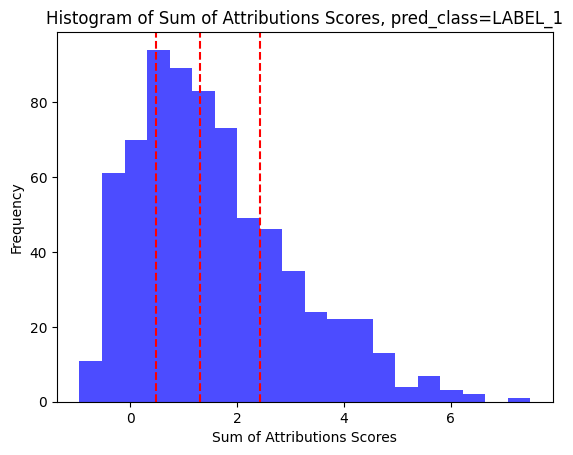

Percentile value: 0.7315115029873399
Percentile value: 1.4521514630118333
Percentile value: 2.204096881811102


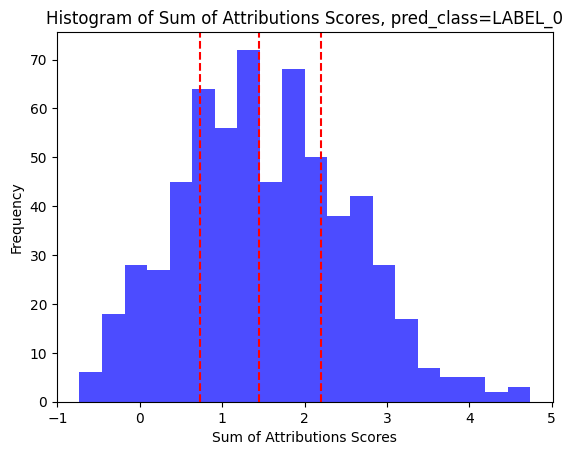

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# Create histograms
for pred_class in [None, "LABEL_1", "LABEL_0"]:
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class)
    hist, bins, _ = plt.hist(sum_attributions, bins=20, color='blue', alpha=0.7)
    plt.title('Histogram of Sum of Attributions Scores, pred_class=' + str(pred_class))
    plt.xlabel('Sum of Attributions Scores')
    plt.ylabel('Frequency')

    # Calculate the percentiles
    percentiles = np.percentile(sum_attributions, [25, 50, 75])

    # Print the percentile values
    for percentile_value in percentiles:
        print("Percentile value:", percentile_value)

    # Draw red lines at the percentile values
    for percentile_value in percentiles:
        plt.axvline(percentile_value, color='red', linestyle='--')

    plt.show()

## Texts: highest scores

In [21]:
import pickle

# Set the desired maximum sequence length
max_sequence_length = 512

# Calculate the percentiles
# percentiles = np.percentile(all_total_attributions, [25, 75])

# Set the attribution threshold as the first and third percentile values
# attribution_threshold_lower = percentiles[0]
# attribution_threshold_upper = percentiles[1]

attribution_threshold_lower = -1.2264066739414712
attribution_threshold_upper = 3.9756553009835245

# Loop through all rows in the dataset
for row_index in range(len(df)):
    # Sum of attributions for the entire text
    sum_attribution = all_sum_attributions[row_index][0]

    # Check if the total attribution falls within the specified thresholds
    if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
        
        # Save the filtered attributions for this row
        attribution_info = (sum_attribution, true_class, predicted_class)

        # Print the information only for rows meeting the threshold
        print(f'True Class for Row {row_index}: {true_class}')
        print(f'Total Attribution for Row {row_index}: {sum_attribution}')

        # Visualize if needed
        if abs(sum_attribution) < attribution_threshold_lower or abs(sum_attribution) > attribution_threshold_upper:
            cls_explainer.visualize(true_class=true_class)


True Class for Row 0: 0
Total Attribution for Row 0: 4.163294731742488


True Class for Row 47: 0
Total Attribution for Row 47: 5.60335264850203


True Class for Row 55: 0
Total Attribution for Row 55: 4.374934901666373


True Class for Row 70: 1
Total Attribution for Row 70: 4.982104830940658


True Class for Row 80: 0
Total Attribution for Row 80: 4.218406236273311


True Class for Row 86: 1
Total Attribution for Row 86: 5.769383780938088


True Class for Row 107: 0
Total Attribution for Row 107: 4.488006135011634


True Class for Row 160: 1
Total Attribution for Row 160: 4.159879263723251


True Class for Row 173: 0
Total Attribution for Row 173: 4.083583864169473


True Class for Row 174: 1
Total Attribution for Row 174: 4.828797902509149


True Class for Row 183: 1
Total Attribution for Row 183: 4.0733257580326505


True Class for Row 189: 1
Total Attribution for Row 189: 4.3171426261920445


True Class for Row 210: 1
Total Attribution for Row 210: 4.567703104241961


True Class for Row 211: 0
Total Attribution for Row 211: 4.115779513811454


True Class for Row 241: 0
Total Attribution for Row 241: 4.715485279660446


True Class for Row 257: 1
Total Attribution for Row 257: 4.111164068994963


True Class for Row 266: 1
Total Attribution for Row 266: 4.264960881946719


True Class for Row 324: 1
Total Attribution for Row 324: 4.539193628293109


True Class for Row 325: 0
Total Attribution for Row 325: 3.9884265980678073


True Class for Row 332: 0
Total Attribution for Row 332: 4.895141783347294


True Class for Row 355: 0
Total Attribution for Row 355: 4.178322182861992


True Class for Row 361: 1
Total Attribution for Row 361: 4.68013925109138


True Class for Row 412: 1
Total Attribution for Row 412: 4.907026934872134


True Class for Row 424: 1
Total Attribution for Row 424: 5.045938718715385


True Class for Row 508: 1
Total Attribution for Row 508: 4.259715482886366


True Class for Row 528: 0
Total Attribution for Row 528: 4.172413269656486


True Class for Row 534: 1
Total Attribution for Row 534: 5.926537295411551


True Class for Row 559: 0
Total Attribution for Row 559: 4.928121694770516


True Class for Row 585: 1
Total Attribution for Row 585: 5.914717541388848


True Class for Row 591: 0
Total Attribution for Row 591: 4.5571526479369435


True Class for Row 595: 1
Total Attribution for Row 595: 4.726443840792981


True Class for Row 621: 1
Total Attribution for Row 621: 4.11054941395245


True Class for Row 636: 1
Total Attribution for Row 636: 4.3349577623000615


True Class for Row 659: 1
Total Attribution for Row 659: 4.467507218665563


True Class for Row 662: 1
Total Attribution for Row 662: 4.565975831538074


True Class for Row 685: 1
Total Attribution for Row 685: 6.37744008060968


True Class for Row 698: 1
Total Attribution for Row 698: 4.412625757422566


True Class for Row 701: 0
Total Attribution for Row 701: 5.204053377970604


True Class for Row 720: 0
Total Attribution for Row 720: 5.50094719840394


True Class for Row 734: 1
Total Attribution for Row 734: 3.9914929158174086


True Class for Row 743: 0
Total Attribution for Row 743: 4.114492255480068


True Class for Row 756: 0
Total Attribution for Row 756: 4.223967304431812


True Class for Row 776: 1
Total Attribution for Row 776: 4.111319576113914


True Class for Row 792: 0
Total Attribution for Row 792: 4.937834571502275


True Class for Row 807: 1
Total Attribution for Row 807: 4.235550855441826


True Class for Row 849: 1
Total Attribution for Row 849: 4.371652360150467


True Class for Row 853: 0
Total Attribution for Row 853: 4.016451866045593


True Class for Row 871: 1
Total Attribution for Row 871: 5.603831875573405


True Class for Row 882: 0
Total Attribution for Row 882: 5.902753002645239


True Class for Row 884: 1
Total Attribution for Row 884: 4.146697092593342


True Class for Row 904: 1
Total Attribution for Row 904: 4.38129831352163


True Class for Row 934: 1
Total Attribution for Row 934: 4.62570477720042


True Class for Row 941: 0
Total Attribution for Row 941: 4.245100115105503


True Class for Row 943: 1
Total Attribution for Row 943: 5.5659953043240105


True Class for Row 948: 1
Total Attribution for Row 948: 4.158519233677797


True Class for Row 1008: 1
Total Attribution for Row 1008: 5.115075162471108


True Class for Row 1049: 1
Total Attribution for Row 1049: 5.551749679968976


True Class for Row 1050: 1
Total Attribution for Row 1050: 4.481378807333028


True Class for Row 1065: 0
Total Attribution for Row 1065: 4.123481898512094


True Class for Row 1086: 1
Total Attribution for Row 1086: 7.487743838895279


True Class for Row 1094: 1
Total Attribution for Row 1094: 4.8549344695161745


True Class for Row 1101: 1
Total Attribution for Row 1101: 4.753795563423346


True Class for Row 1108: 1
Total Attribution for Row 1108: 4.376423789437325


True Class for Row 1155: 0
Total Attribution for Row 1155: 4.259974826277052


True Class for Row 1181: 1
Total Attribution for Row 1181: 4.1669101482024775


True Class for Row 1232: 1
Total Attribution for Row 1232: 6.425221401633655


True Class for Row 1234: 0
Total Attribution for Row 1234: 4.7401024404493395


True Class for Row 1277: 0
Total Attribution for Row 1277: 4.34407591182662


True Class for Row 1278: 1
Total Attribution for Row 1278: 5.592688209112758


## Visualize highest and lowest (explainer)

In [22]:
import numpy as np

# Set the desired maximum sequence length
max_sequence_length = 512

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        print(all_sum_attributions[row_index], sum_attribution)

        # Visualize the attributions for the text
        cls_explainer.visualize(true_class=true_class)

(7.487743838895279, 1, 'LABEL_1') tensor(7.4877, device='cuda:0', dtype=torch.float64)


(6.425221401633655, 1, 'LABEL_1') tensor(6.4252, device='cuda:0', dtype=torch.float64)


(6.37744008060968, 1, 'LABEL_1') tensor(6.3774, device='cuda:0', dtype=torch.float64)


(5.926537295411551, 1, 'LABEL_1') tensor(5.9265, device='cuda:0', dtype=torch.float64)


(5.914717541388848, 1, 'LABEL_1') tensor(5.9147, device='cuda:0', dtype=torch.float64)


(5.902753002645239, 0, 'LABEL_1') tensor(5.9028, device='cuda:0', dtype=torch.float64)


(5.769383780938088, 1, 'LABEL_1') tensor(5.7694, device='cuda:0', dtype=torch.float64)


(5.603831875573405, 1, 'LABEL_1') tensor(5.6038, device='cuda:0', dtype=torch.float64)


(5.60335264850203, 0, 'LABEL_1') tensor(5.6034, device='cuda:0', dtype=torch.float64)


(5.592688209112758, 1, 'LABEL_1') tensor(5.5927, device='cuda:0', dtype=torch.float64)


(4.7401024404493395, 0, 'LABEL_0') tensor(4.7401, device='cuda:0', dtype=torch.float64)


(4.715485279660446, 0, 'LABEL_0') tensor(4.7155, device='cuda:0', dtype=torch.float64)


(4.5571526479369435, 0, 'LABEL_0') tensor(4.5572, device='cuda:0', dtype=torch.float64)


(4.374934901666373, 0, 'LABEL_0') tensor(4.3749, device='cuda:0', dtype=torch.float64)


(4.223967304431812, 0, 'LABEL_0') tensor(4.2240, device='cuda:0', dtype=torch.float64)


(4.178322182861992, 0, 'LABEL_0') tensor(4.1783, device='cuda:0', dtype=torch.float64)


(4.163294731742488, 0, 'LABEL_0') tensor(4.1633, device='cuda:0', dtype=torch.float64)


(4.115779513811454, 0, 'LABEL_0') tensor(4.1158, device='cuda:0', dtype=torch.float64)


(4.114492255480068, 0, 'LABEL_0') tensor(4.1145, device='cuda:0', dtype=torch.float64)


(3.938632838206396, 0, 'LABEL_0') tensor(3.9386, device='cuda:0', dtype=torch.float64)


## Trial

In [9]:
# Define a function to get the HTML file name
def get_html_fname(pred_class):
    return 'attributions_' + pred_class + '.html'

# Set the desired maximum sequence length
max_sequence_length = 512

# Initialize the HTML content
html_content = "<html><head><title>Essays with highest scores</title></head><body>"

# Obtain attributions
for pred_class in ["LABEL_1", "LABEL_0"]:

    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Visualize the attributions for the texts corresponding to the highest and lowest total attribution scores
    num_elements_to_show=10
    for element in sorted_list[:num_elements_to_show]:
        # Extract row information
        row_index = element[1]
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name

        # Sum of attributions for the entire text
        sum_attribution = cls_explainer.attributions.attributions_sum.sum()

        # Add the information to the HTML content
        html_content += f"<p>{all_sum_attributions[row_index]}, {sum_attribution}</p>"

        # Visualize the attributions for the text
        explanation_html = cls_explainer.visualize(true_class=true_class).data

        # Add the text to the HTML content
        html_content += str(explanation_html)

    # Close the HTML content
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname(pred_class)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

    # Reset the HTML content for the next pred_class
    html_content = "<html><body>"

## Visualize sentences with a particular word (sum attribution ordering)

In [15]:
def get_html_fname_essays(word_of_interest):
    return 'avg_essay_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 512

# Define the list of words of interest and other parameters
words_of_interest = ["glad", "movie", "funny", "lazy", "help"]
pred_class_of_interest = "LABEL_0"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get filtered sum attributions
    sum_attributions = filter_sum_attributions(all_sum_attributions, pred_class=pred_class_of_interest, get_attr_plus_idx=True)
    
    # Sort attributions
    sorted_list = sorted(sum_attributions, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    num_elem = 0
    for element in sorted_list:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        if score is not None:
            # Extract row information
            preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
            word_attributions = cls_explainer(preproc_text)
            true_class = df.loc[row_index, trait]
            predicted_class = cls_explainer.predicted_class_name
            
            # Print score
            print(word_of_interest, "score:", score)

            # Visualize and collect HTML content
            explanation_html = cls_explainer.visualize(true_class=true_class).data
            html_content += f"<h3>{word_of_interest} score: {score}</h3>"
            html_content += str(explanation_html)  # Ensure conversion to string
            
            num_elem += 1
            if num_elem == max_elements_to_show:
                break

    # Close the HTML content
    html_content += "</body></html>"

    # Close the HTML file name
    html_fname = get_html_fname_essays(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

glad score: -0.026714967041409406


glad score: 0.1165234795096395


glad score: 0.06475439204515049


glad score: 0.28205785686011897


glad score: 0.2220149382909216


glad score: 0.34453549576123754


glad score: 0.0335336645907558


glad score: -0.04424972095430119


glad score: 0.036102892022887315


glad score: 0.17833539830902576


movie score: 0.07601299061814143


movie score: 0.08506685574214097


movie score: 0.07904553388720569


movie score: 0.058893653913985614


movie score: 0.05719023273181026


movie score: 0.14273172770506418


movie score: 0.3391946725792858


movie score: 0.10588560841473414


movie score: 0.06480643307423237


movie score: 0.07517356786427053


funny score: 0.00015830996723551085


funny score: -0.024149877754688603


funny score: -0.06901714258037843


funny score: -0.03250929897144522


funny score: -0.1310301110392913


funny score: -0.014049642385691518


funny score: -0.013630500780482755


funny score: -0.03740875026007233


funny score: -0.06626633448742575


funny score: 0.27977337009847975


lazy score: -0.5229508344818616


lazy score: -0.07222557958611402


lazy score: -0.11975284432642846


lazy score: -0.004396191075280718


lazy score: 0.2328315295488623


lazy score: -0.013674667540306126


lazy score: 0.2607598166929666


lazy score: -0.03705653846907848


lazy score: 0.33492895370837034


help score: 0.07925847877185832


help score: 0.025329269719480504


help score: 0.023897051039562467


help score: -0.08294926666130181


help score: 0.0017697784396235466


help score: -0.039850306702273165


help score: -0.006102052572513908


help score: 0.08143318683344536


help score: 0.02263964386613293


help score: -0.009621556611910016


## Visualize sentences with a particular word (word attribution ordering)

In [16]:
def get_html_fname_essays(word_of_interest):
    return 'avg_word_' + word_of_interest.replace("/", "_") + '.html'

# Set the desired maximum sequence length
max_sequence_length = 512

# Define the list of words of interest and other parameters
words_of_interest = ["glad", "movie", "funny", "lazy", "help"]
pred_class_of_interest = "LABEL_0"
max_elements_to_show = 10

for word_of_interest in words_of_interest:
    # Get word score info
    word_scores = get_max_word_scores(word_of_interest, all_word_attributions, pred_class_of_interest)

    # Sort word scores
    sorted_list = sorted(word_scores, key=lambda x: x[0], reverse=True)

    # Initialize HTML content string
    html_content = "<html><head><title>Word Attribution Scores</title></head><body>"

    for element in sorted_list[:max_elements_to_show]:
        # Extract row information
        row_index = element[1]
        
        word_attributions = all_word_attributions[row_index]
            
        # Check if word is contained in the current sentence
        score = get_max_word_score(word_of_interest, word_attributions)
        
        # Extract row information
        preproc_text = get_preproc_text(df, row_index, tokenizer, max_sequence_length)
        word_attributions = cls_explainer(preproc_text)
        true_class = df.loc[row_index, trait]
        predicted_class = cls_explainer.predicted_class_name
            
        # Print score
        print(word_of_interest, "score:", score)

        # Visualize and collect HTML content
        explanation_html = cls_explainer.visualize(true_class=true_class).data
        html_content += f"<h3>{word_of_interest} score: {score}</h3>"
        html_content += explanation_html

    # Close HTML content string
    html_content += "</body></html>"

    # Get the HTML file name
    html_fname = get_html_fname_essays(word_of_interest)

    # Save the collected HTML content to a file
    with open(html_fname, 'w') as file:
        file.write(html_content)

glad score: 0.3720380539085274


glad score: 0.34453549576123754


glad score: 0.2870342202878833


glad score: 0.28205785686011897


glad score: 0.2355703109932308


glad score: 0.23455334030665476


glad score: 0.2220149382909216


glad score: 0.21717257634343334


glad score: 0.18753237457298624


glad score: 0.18570155136775823


movie score: 0.3391946725792858


movie score: 0.32487544829506837


movie score: 0.1798353962390285


movie score: 0.16018880064530858


movie score: 0.14273172770506418


movie score: 0.10588560841473414


movie score: 0.09149365987152516


movie score: 0.08506685574214097


movie score: 0.07904553388720569


movie score: 0.07601299061814143


funny score: 0.3056584355005804


funny score: 0.27977337009847975


funny score: 0.23194790817559602


funny score: 0.041021260206386446


funny score: 0.00015830996723551085


funny score: -0.013094126820443227


funny score: -0.013630500780482755


funny score: -0.014049642385691518


funny score: -0.021298558887109513


funny score: -0.024149877754688603


lazy score: 0.33492895370837034


lazy score: 0.2607598166929666


lazy score: 0.2328315295488623


lazy score: -0.004396191075280718


lazy score: -0.013674667540306126


lazy score: -0.03705653846907848


lazy score: -0.07222557958611402


lazy score: -0.11975284432642846


lazy score: -0.5229508344818616


help score: 0.2209610986128383


help score: 0.08611388348553999


help score: 0.08143318683344536


help score: 0.07925847877185832


help score: 0.05875188590735003


help score: 0.041736016121773176


help score: 0.03621520140182797


help score: 0.028552922373578274


help score: 0.025329269719480504


help score: 0.023897051039562467
